# Import Packages


In [ ]:
! pip install tensorflowjs
! pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.7 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.31.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 997.4/997.4 kB 20.0 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras as keras
from tensorflow.keras import regularizers
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.metrics import TruePositives, FalsePositives, TrueNegatives, FalseNegatives, BinaryAccuracy, Precision, Recall, AUC
import visualkeras
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.express as px
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import pathlib
import os
import time
import cv2

In [ ]:
print(tf.keras.__version__)

3.8.0


In [ ]:
%load_ext tensorboard

# Data Collection

In [ ]:
from google.colab import files
uploaded = files.upload()

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
! kaggle datasets download -d wadhasnalhamdan/date-fruit-image-dataset-in-controlled-environment

Dataset URL: https://www.kaggle.com/datasets/wadhasnalhamdan/date-fruit-image-dataset-in-controlled-environment
License(s): Attribution 4.0 International (CC BY 4.0)


In [ ]:
import zipfile

def extract(source, destination):
    zip = zipfile.ZipFile(source, "r")
    zip.extractall(destination)
    zip.close()
    print("[SUCCESS] {} berhasil diekstrak ke '{}'".format(os.path.basename(source), destination))

source = "/content/date-fruit-image-dataset-in-controlled-environment.zip"
destination = "/content/date-fruit-image-dataset-in-controlled-environment"

extract(source, destination)

[SUCCESS] date-fruit-image-dataset-in-controlled-environment.zip berhasil diekstrak ke '/content/date-fruit-image-dataset-in-controlled-environment'


In [ ]:
import pandas as pd

def df_from_directory(data_path):

    file_names = []
    file_paths = []
    labels = []
    classes_list = sorted(os.listdir(data_path))

    for class_name in classes_list:

        label = class_name
        class_path = os.path.join(data_path, class_name)
        file_list = sorted(os.listdir(class_path))

        for file_name in file_list:
            file_path = os.path.join(class_path, file_name)
            file_names.append(file_name)
            file_paths.append(file_path)
            labels.append(label)

    data_df = pd.DataFrame({
        'filename': file_names,
        'image_path': file_paths,
        'label': labels
    })

    return data_df

In [ ]:
# Baca file2 dalam dataset ke Dataframe Pandas

data_path = "/content/date-fruit-image-dataset-in-controlled-environment"

data_df = df_from_directory(data_path)
data_df.head()

,filename,image_path,label
0,Ajwa Date (1).JPG,/content/date-fruit-image-dataset-in-controlle...,Ajwa
1,Ajwa Date (10).JPG,/content/date-fruit-image-dataset-in-controlle...,Ajwa
2,Ajwa Date (100).JPG,/content/date-fruit-image-dataset-in-controlle...,Ajwa
3,Ajwa Date (101).JPG,/content/date-fruit-image-dataset-in-controlle...,Ajwa
4,Ajwa Date (102).JPG,/content/date-fruit-image-dataset-in-controlle...,Ajwa


# Data Understanding

In [ ]:
data_df.describe()

,filename,image_path,label
count,1658,1658,1658
unique,1658,1658,9
top,Sugaey Date (99).JPG,/content/date-fruit-image-dataset-in-controlle...,Sokari
freq,1,1,264


In [ ]:
x = data_df['label'].value_counts().index.tolist()
y = data_df['label'].value_counts().values.tolist()

In [ ]:
# plot distribusi per kelas

dist_df = pd.DataFrame({'Kelas': x, 'Jumlah': y})

fig = px.bar(dist_df, x='Kelas', y='Jumlah', title='Data Distribution', text=y)
fig.update_traces(textposition='outside')

fig.show()

In [ ]:
fig = px.pie(dist_df, values='Jumlah', names='Kelas', title='Data Distribution', height=750, color_discrete_sequence=px.colors.qualitative.G10)
# fig.update_traces(textposition='inside', textinfo='percent + label')

fig.show()

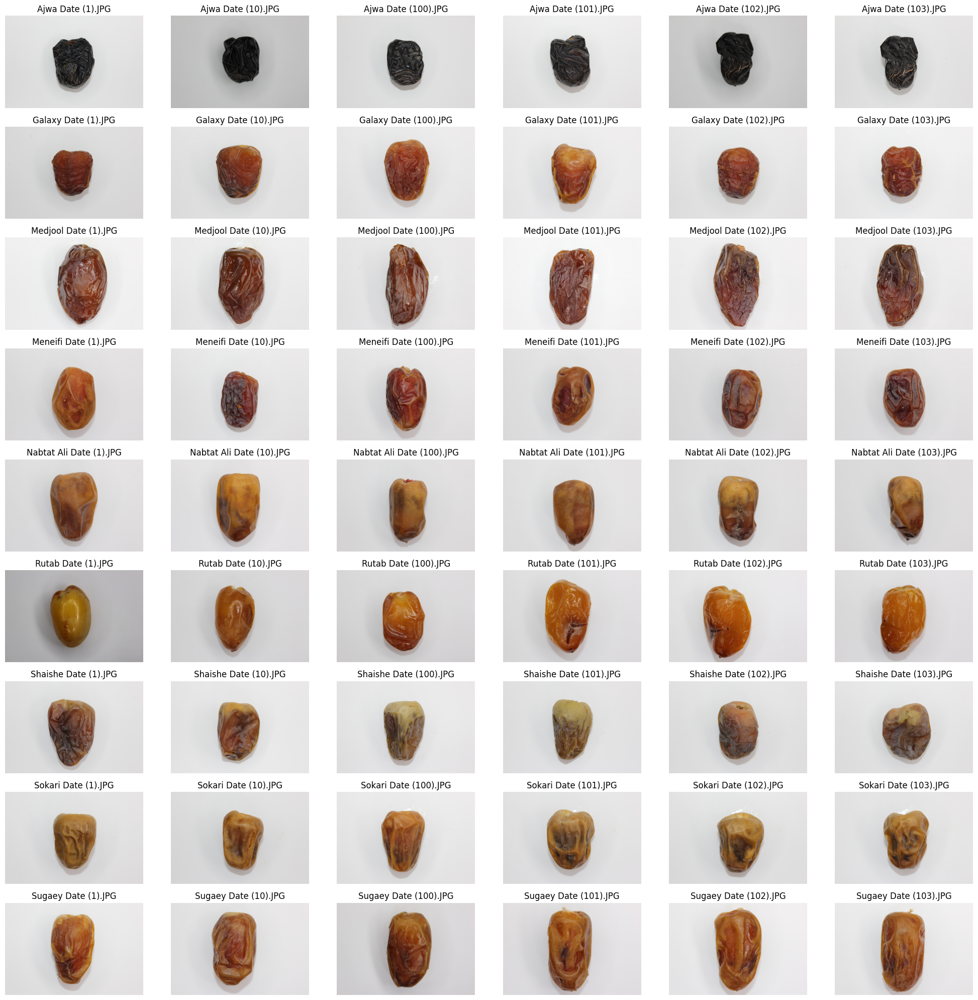

In [ ]:
classes_name = ['Ajwa', 'Galaxy', 'Medjool', 'Meneifi', 'Nabtat Ali', 'Rutab', 'Shaishe', 'Sokari', 'Sugaey']
num_samples_per_class = 6

fig, axes = plt.subplots(len(classes_name), num_samples_per_class, figsize=(20, 20))

for class_index, class_name in enumerate(classes_name):
    class_df = data_df[data_df['label'] == class_name]
    for i in range(num_samples_per_class):
      image_path = class_df['image_path'].iloc[i]
      img = mpimg.imread(image_path)
      axes[class_index, i].imshow(img)
      axes[class_index, i].set_title(os.path.basename(image_path))
      axes[class_index, i].axis('off')

plt.tight_layout()
plt.show()

# Data Preparation

In [ ]:
# fungsi generator

def create_generators(train_df, valid_df, test_df, batch_size):

    train_gen = ImageDataGenerator(
        rotation_range=360,
        zoom_range=0.20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode="nearest"
    )

    val_test_gen = ImageDataGenerator()

    train_gen = train_gen.flow_from_dataframe(
        train_df,
        x_col='image_path',
        y_col='label',
        target_size=(224, 224),
        class_mode='categorical',
        shuffle=True,
        # batch_size=batch_size
    )

    valid_gen = val_test_gen.flow_from_dataframe(
        valid_df,
        x_col='image_path',
        y_col='label',
        target_size=(224, 224),
        class_mode='categorical',
        shuffle=True,
        # batch_size=batch_size
    )

    test_gen = val_test_gen.flow_from_dataframe(
        test_df,
        x_col='image_path',
        y_col='label',
        target_size=(224, 224),
        class_mode='categorical',
        shuffle=True,
        # batch_size=batch_size
    )

    return train_gen, valid_gen, test_gen

In [ ]:
train_df, temp_df = train_test_split(data_df,  train_size=0.8, shuffle=True)
test_df, val_df = train_test_split(temp_df,  train_size=0.5, shuffle=True)

In [ ]:
# training, validation, testing

train_gen, val_gen, test_gen = create_generators(train_df, val_df, test_df, batch_size=64)

Found 1326 validated image filenames belonging to 9 classes.
Found 166 validated image filenames belonging to 9 classes.
Found 166 validated image filenames belonging to 9 classes.


In [ ]:
train_gen.class_indices.keys()

dict_keys(['Ajwa', 'Galaxy', 'Medjool', 'Meneifi', 'Nabtat Ali', 'Rutab', 'Shaishe', 'Sokari', 'Sugaey'])

# Modeling

### Sequential Model

In [ ]:
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

base_model = tf.keras.applications.MobileNetV2(include_top=False, weights='imagenet', input_shape= img_shape, pooling= 'max')

base_model.trainable = False

model = keras.Sequential([
    base_model,
    keras.layers.Flatten(),
    keras.layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(class_count, activation= 'softmax', kernel_regularizer=tf.keras.regularizers.L2(0.01))
])

metrics = [
    BinaryAccuracy(name='accuracy'),
    Precision(name='precision'),
    Recall(name='recall'),
    AUC(name='auc'),
    TruePositives(name='tp'),
    FalsePositives(name='fp'),
    TrueNegatives(name='tn'),
    FalseNegatives(name='fn')
]

model.compile(keras.optimizers.Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=metrics)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │        40,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 9)              │           153 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,299,657 (8.77 MB)

 Trainable params: 41,673 (162.79 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="model_plot.png",
    show_shapes=True,
    show_layer_names=False,
    show_layer_activations=True,
    expand_nested="true"
)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning:

The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.



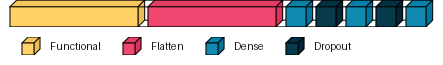

In [ ]:
visualkeras.layered_view(model, legend=True)

### Functional API

In [ ]:
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

base_model = tf.keras.applications.MobileNetV2(include_top=False, weights='imagenet', input_shape=img_shape, pooling='max')

model = keras.layers.Flatten()(base_model.output)
model = keras.layers.Dense(32, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(model)
model = keras.layers.Dropout(0.2)(model)
model = keras.layers.Dense(16, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(model)
model = keras.layers.Dropout(0.2)(model)
prediction = keras.layers.Dense(len(classes_name), activation='softmax', activity_regularizer=tf.keras.regularizers.L2(0.01))(model)

model = keras.models.Model(inputs=base_model.input, outputs=prediction)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,299,657 (8.77 MB)

 Trainable params: 2,265,545 (8.64 MB)

 Non-trainable params: 34,112 (133.25 KB)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning:

The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.



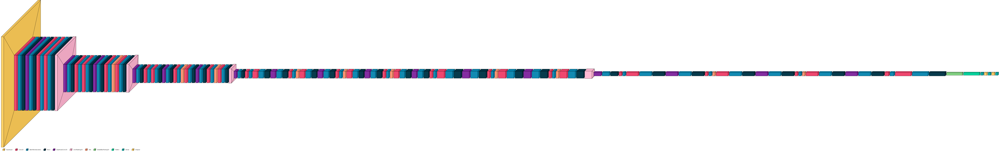

In [ ]:
visualkeras.layered_view(model, legend=True)

# Training

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

checkpoint_filepath = '/content/checkpoint/ResNet50_model.weights.h5'

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='loss',
    mode='max',
    save_best_only=True)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="/content/logs", histogram_freq=1)

callbacks = [early_stopping, model_checkpoint_callback, tensorboard_callback]

In [ ]:
history = model.fit(x=train_gen, epochs=250, verbose=1, callbacks=callbacks, validation_data=val_gen, shuffle=False)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/250
42/42 ━━━━━━━━━━━━━━━━━━━━ 162s 4s/step - accuracy: 0.8792 - auc: 0.5361 - fn: 696.2558 - fp: 40.0233 - loss: 3.7013 - precision: 0.1321 - recall: 0.0143 - tn: 5579.3257 - tp: 6.1628 - val_accuracy: 0.8889 - val_auc: 0.6075 - val_fn: 166.0000 - val_fp: 0.0000e+00 - val_loss: 2.9853 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_tn: 1328.0000 - val_tp: 0.0000e+00
Epoch 2/250
42/42 ━━━━━━━━━━━━━━━━━━━━ 129s 3s/step - accuracy: 0.8893 - auc: 0.5584 - fn: 695.7209 - fp: 2.7209 - loss: 3.0519 - precision: 0.5815 - recall: 0.0072 - tn: 5616.6279 - tp: 6.6977 - val_accuracy: 0.8889 - val_auc: 0.6205 - val_fn: 166.0000 - val_fp: 0.0000e+00 - val_loss: 2.9243 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_tn: 1328.0000 - val_tp: 0.0000e+00
Epoch 3/250
42/42 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.8922 - auc: 0.5878 - fn: 674.4418 - fp: 2.2326 - loss: 2.9322 - precision: 0.8590 - recall: 0.0342 - tn: 5617.1162 - tp: 27.9767 - val_accuracy: 0.8896 - val

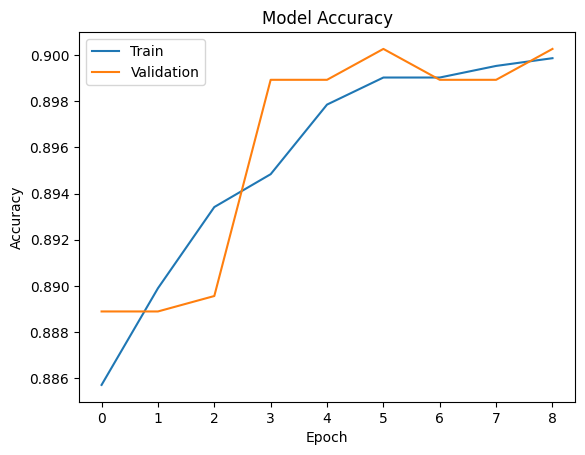

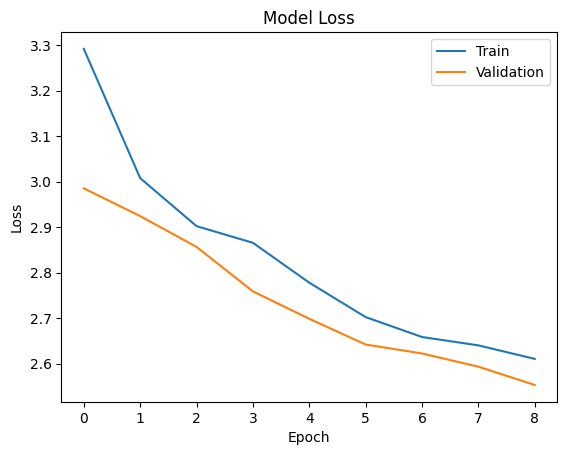

In [ ]:
# Plot akurasi
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [ ]:
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

# Evaluation

In [ ]:
def infer_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0
    images = np.vstack([x])
    pred = model.predict(images, batch_size=10)
    predicted_class = np.argmax(pred)
    class_labels = list(train_gen.class_indices.keys())
    predicted_label = class_labels[predicted_class]
    return predicted_label

In [ ]:
image_path_to_infer = '/content/date-fruit-image-dataset-in-controlled-environment/Ajwa/Ajwa Date (100).JPG'
predicted_label = infer_image(image_path_to_infer, model)

print(f"Predicted Label: {predicted_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predicted Label: Ajwa


In [ ]:
results = model.evaluate(test_gen)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.8968 - auc: 0.6922 - fn: 107.2857 - fp: 0.0000e+00 - loss: 2.6922 - precision: 1.0000 - recall: 0.0710 - tn: 928.0000 - tp: 8.7143


6/6 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step


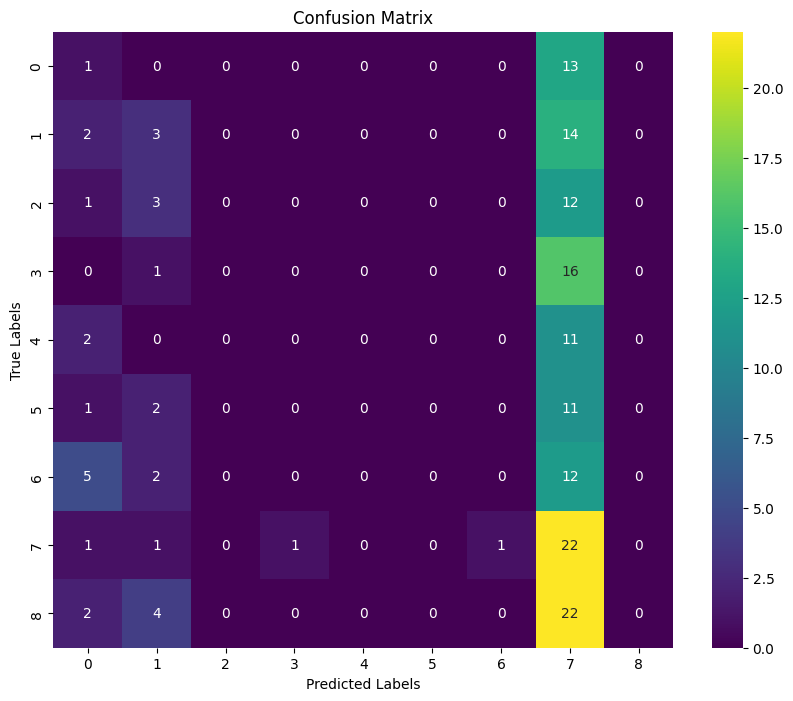

In [ ]:
y_true = test_gen.classes

y_pred_probs = model.predict(test_gen)
y_pred = np.argmax(y_pred_probs, axis=1)

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Deployment

### TF SavedModel Format

Simpan menjadi format TensorFlow SavedModel

In [ ]:
save_path = '/content/my_model'

tf.saved_model.save(model, save_path)

In [ ]:
! tensorflowjs_converter \
    --input_format=tf_saved_model \
    --output_node_names='MobilenetV2' \
    --saved_model_tags=serve \
    /content/my_model \
    /content/my_tfjs_model

2025-05-02 10:52:09.615238: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746183129.636602   11534 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746183129.643489   11534 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2025-05-02 10:52:20.643168: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1746183140.643354   11534 gpu_device.cc:2022] Created device /job:localhost/replica:0/task

## Keras Model Format

Simpan menjadi format Keras Model

In [ ]:
save_path = '/content/my_model.keras'

model.save(save_path)

In [ ]:
! tensorflowjs_converter \
    --input_format=keras \
    /content/my_model.keras \
    /content/my_tfjs_model

In [ ]:
# ! rm -rf /content/my_tfjs_model

## Unduh model

In [ ]:
def zip_directory(directory_path, zip_filename):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, _, files in os.walk(directory_path):
            for file in files:
                file_path = os.path.join(root, file)
                zipf.write(file_path, arcname=os.path.relpath(file_path, directory_path))

In [ ]:
zip_directory('/content/my_model', 'my_model.zip')
zip_directory('/content/my_tfjs_model', 'my_tfjs_model.zip')